# Week 2 Assignment on Background Subject 
## Submitted by Sourav Mazumdar 170710007055

# Import the necessary libraries

In [1]:
import numpy as np
import matplotlib.image as mpimg
import matplotlib.pyplot as plt 
import os
import sys
import cv2


In [25]:
def load_image(img_path):
    return cv2.imread(img_path)

## Steps to perform Background Subtraction
1.  Initialize the mean and variance images
2.  Classify images into foreground and background pixels using a Chebyshev inequality based classifier
3.  Reduce the image noise using a voting scheme
4.  Update the mean and variance images using a weighted average scheme
5.  Repeat steps 1 through 4 for all images

## Step 1

In [26]:
def initBackground(initImage):
    img_arr = mpimg.imread(initImage)
    mean = img_arr
    variance = 9*np.ones(img_arr.shape)
    return(mean,variance)

## Step 2

In [27]:
def ForegroundDetection(img,mean,variance,lmda):
    difference = img - mean
    y = variance*(lmda**2)
    difference_2 = np.square(difference)
    I = difference_2 - y
    mask = np.all(I>0,axis=2)
    rI = 255*mask.astype(int)
    rI = rI.astype(np.uint8)
    return rI

## Step 3

In [4]:
def Voting(rI,eta,m,n):
    r,c = rI.shape
    cI = np.zeros((rI.shape[0],rI.shape[1]))
    for i in range(m,r-1-m):
        for j in range(n,c-1-n):
            img_patch = rI[i-m:i,j-n:j]
            y_unq, counts = np.unique(img_patch,return_counts=True)
            if len(counts) == 1 and y_unq[0] == 1:
                cI[i,j] = 255
            if len(counts)>1:
                if counts[1] > eta*m*n:
                    cI[i,j] = 255
    cI = cI.astype(np.uint8)
    return cI

## Step 4

In [28]:
def meanvarUpdate(cI,img,M,V,alpha):
    mean_upd = np.zeros(img.shape)
    var_upd = np.zeros(img.shape)
    d = img - M
    d_2 = np.square(d)
    for i in range(cI.shape[0]):
        for j in range(cI.shape[1]):
            if cI[i,j] == 0:
                mean_upd[i,j,:] = (1-alpha)*M[i,j,:] + alpha*img[i,j,:]
                var_upd[i,j,:] = (1-alpha)*(V[i,j,:] + alpha*d_2[i,j,:])
                var_upd[i,j,:] = np.clip(var_upd[i,j,:],a_min = 9,a_max = None)
    return(mean_upd,var_upd)

In [29]:
def Background_Subtraction(img_dir,lmda,eta,m,n,alpha):
    
    img_file_name = os.listdir(img_dir)
    img_file_name.sort()
    initImage = os.path.join(img_dir,img_file_name[0])
        
    #Initialize the mean image
    mean, variance = initBackground(initImage)
    
    #Select other images to perform background subtraction
    for i in [1,5,10,20,30]:
        img_path = os.path.join(img_dir,img_file_name[i])
        img = load_image(img_path)
        fig, ax = plt.subplots(1,3,figsize=(10,10))
        
        #Get the foreground mask
        rI = ForegroundDetection(img,mean,variance,lmda)
        ax[0].imshow(rI,cmap="gray") #Show the unfiltered mask
        
        #Reduce noise using voting 
        cI = Voting(rI,eta,m,n)
        ax[1].imshow(cI,cmap="gray") #Show the filetered mask
        
        #Update the mean and variance 
        mean, variance = meanvarUpdate(cI,img,mean,variance,alpha)
        
        #Show the original image
        ax[2].imshow(img,cmap="gray")
        plt.show()
    return(mean,variance)

Using lambda as 0.7 and eta as 0.7


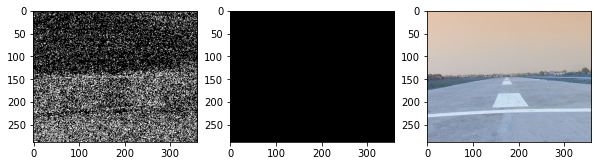

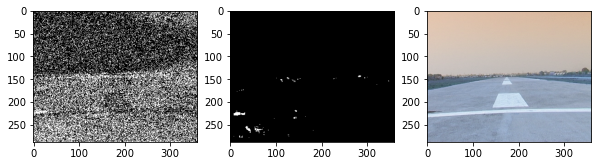

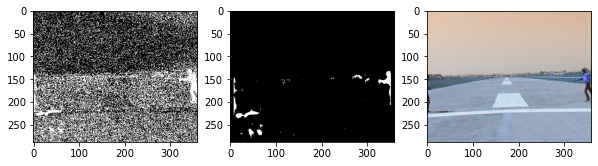

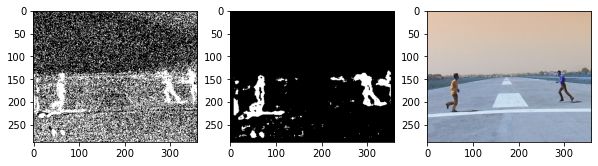

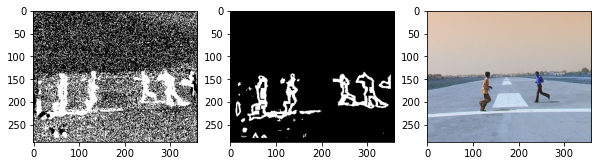




Using lambda as 0.72 and eta as 0.7


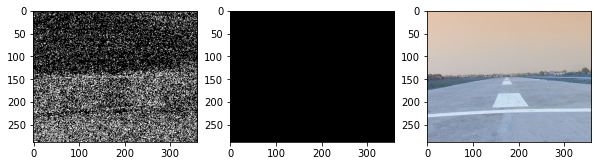

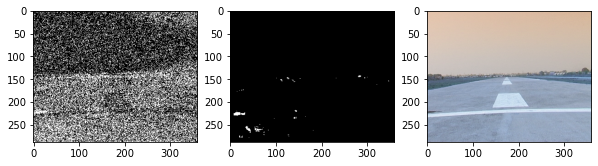

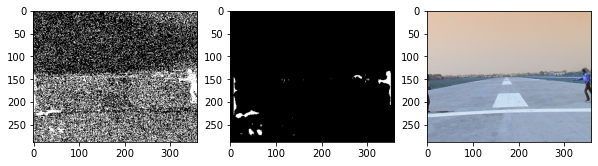

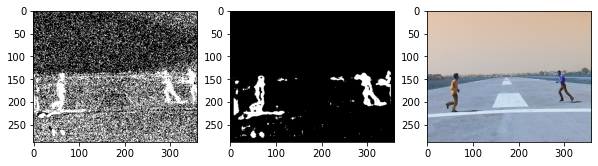

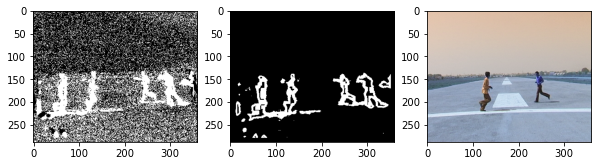




Using lambda as 0.74 and eta as 0.7


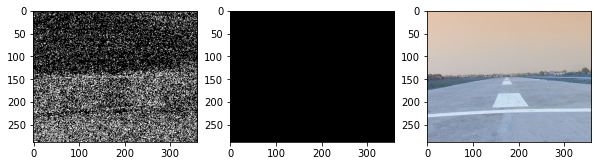

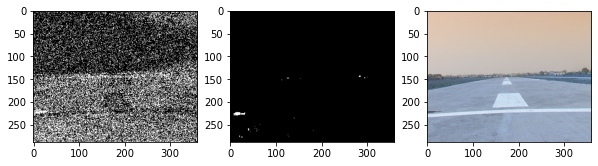

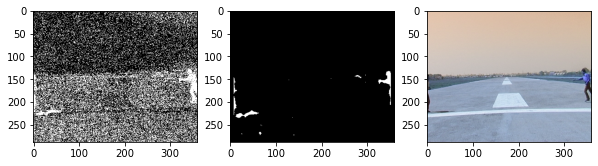

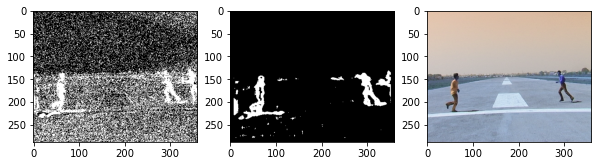

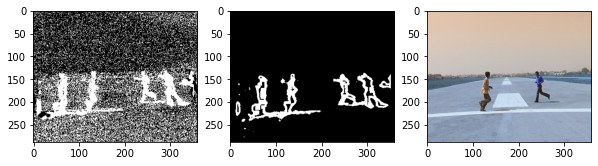




Using lambda as 0.76 and eta as 0.7


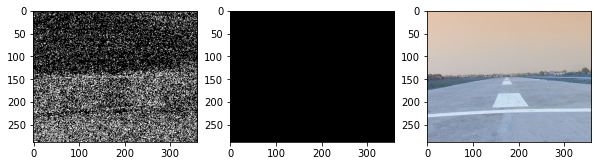

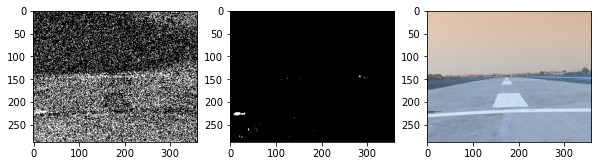

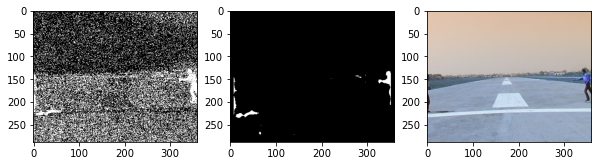

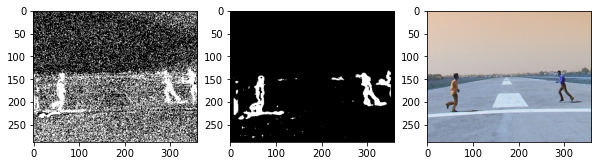

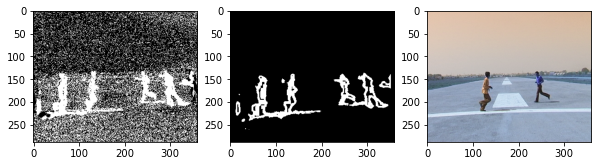




Using lambda as 0.78 and eta as 0.7


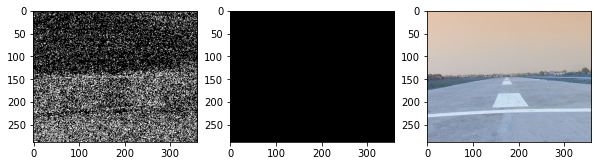

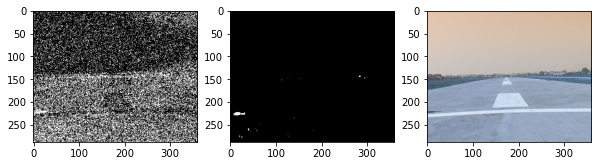

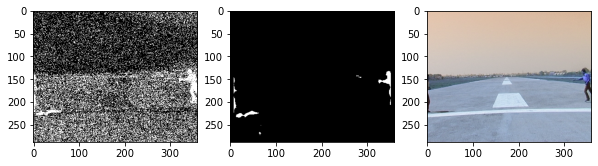

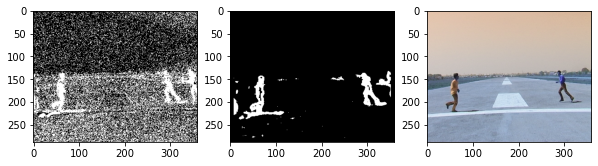

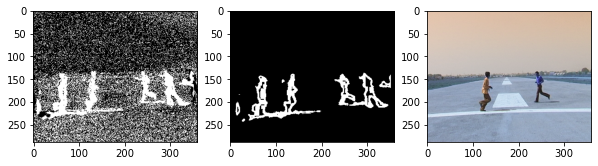




Using lambda as 0.8 and eta as 0.7


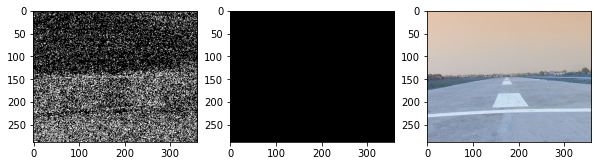

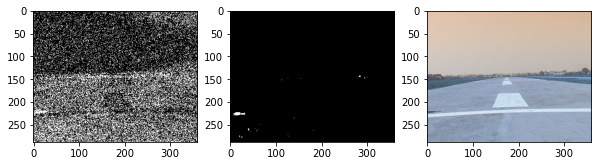

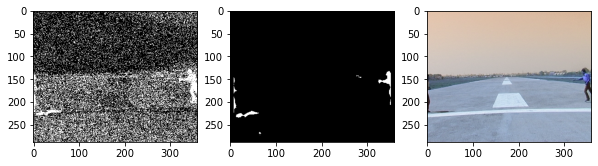

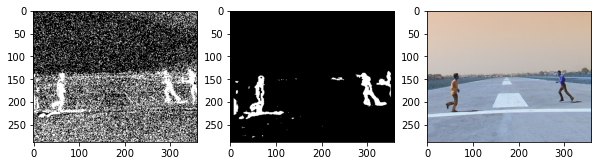

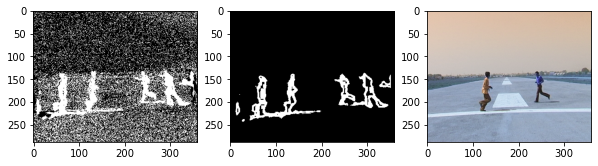




Using lambda as 0.8200000000000001 and eta as 0.7


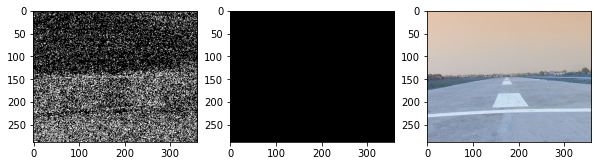

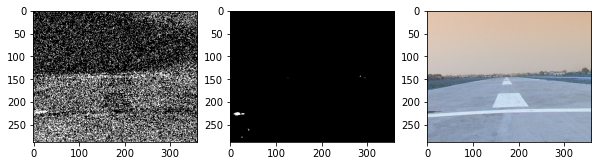

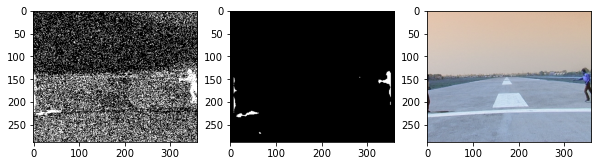

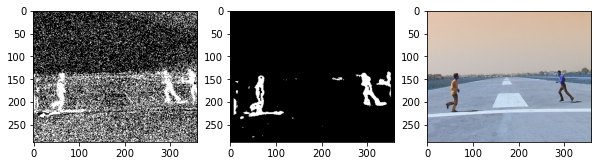

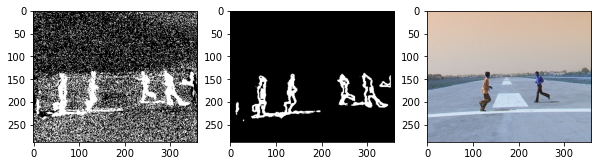




Using lambda as 0.8400000000000001 and eta as 0.7


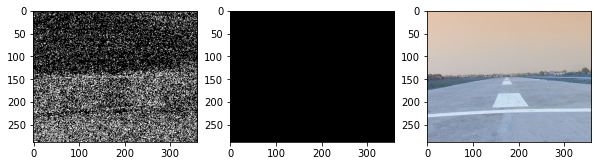

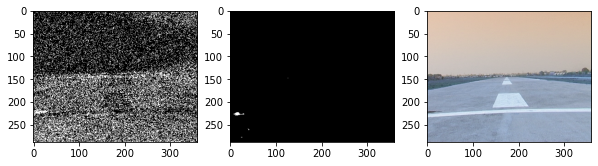

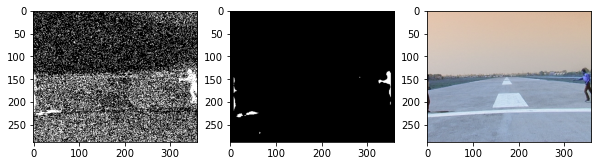

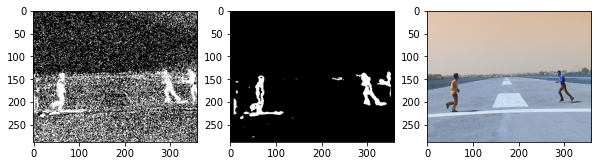

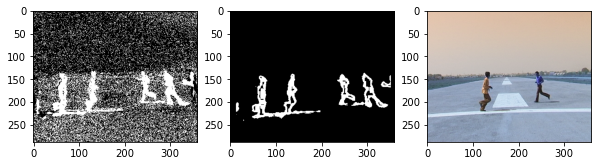




Using lambda as 0.8600000000000001 and eta as 0.7


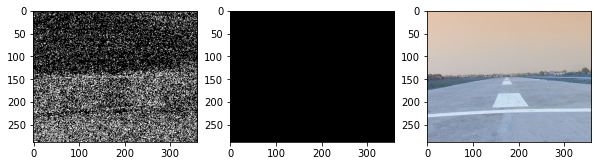

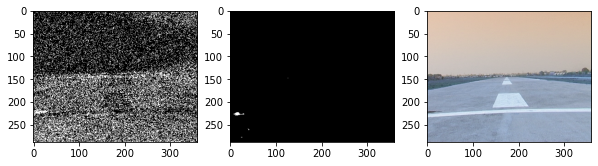

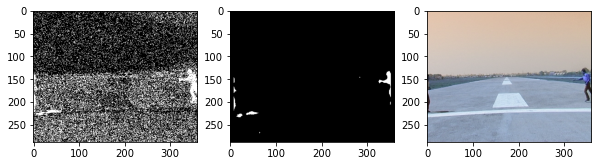

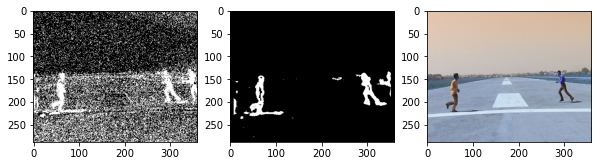

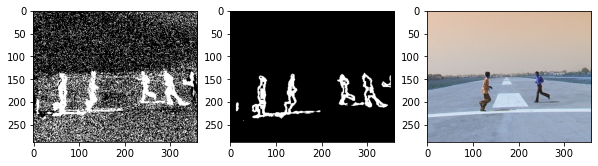




Using lambda as 0.8800000000000001 and eta as 0.7


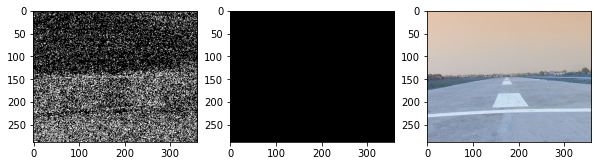

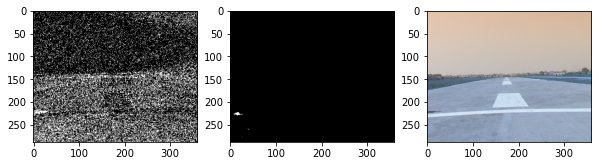

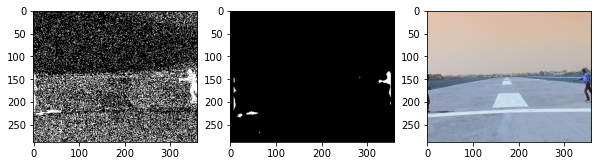

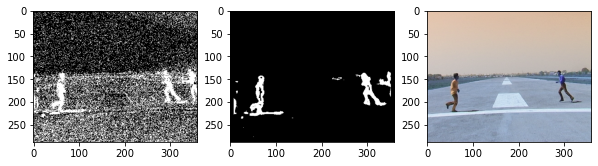

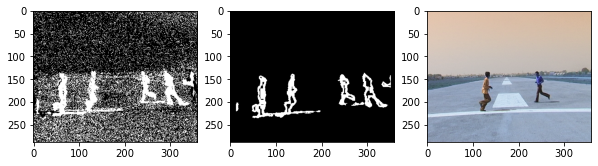




Using lambda as 0.9000000000000001 and eta as 0.7


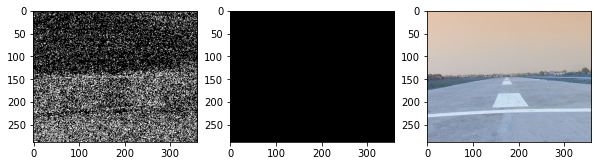

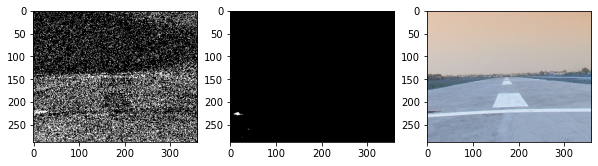

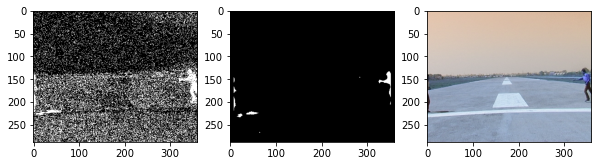

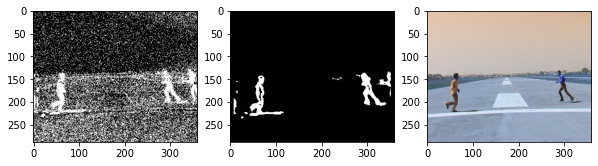

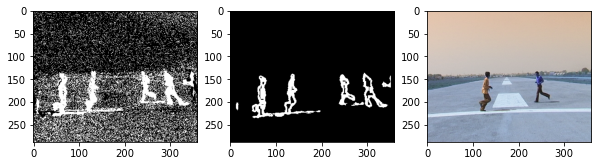




Using lambda as 0.7 and eta as 0.72


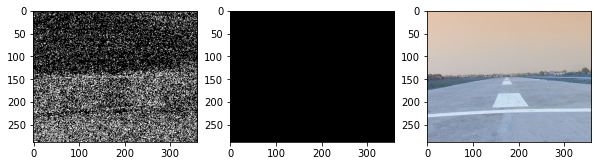

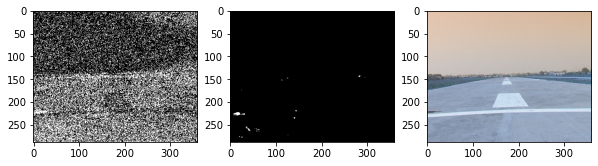

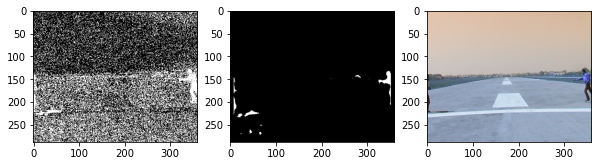

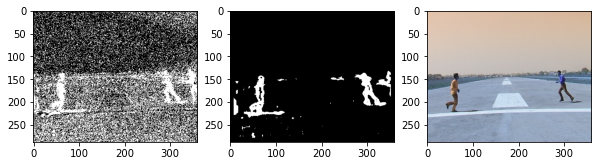

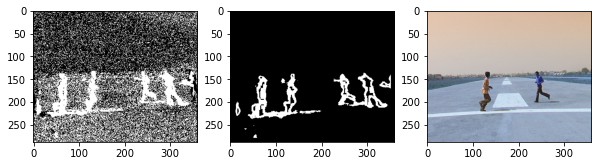




Using lambda as 0.72 and eta as 0.72


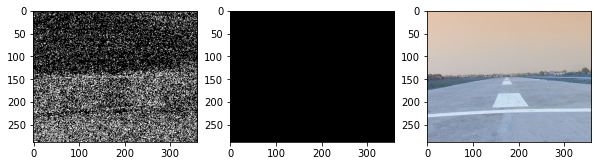

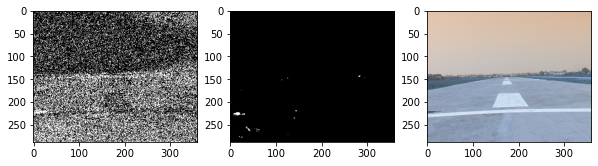

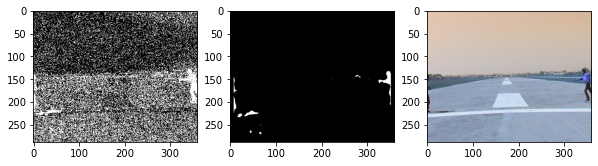

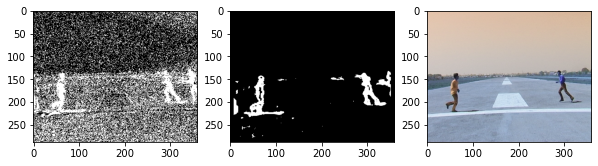

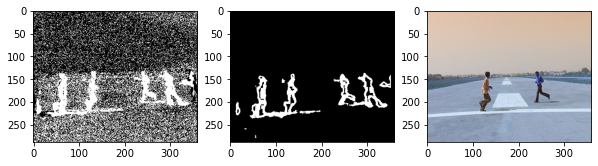




Using lambda as 0.74 and eta as 0.72


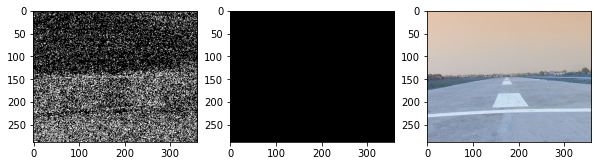

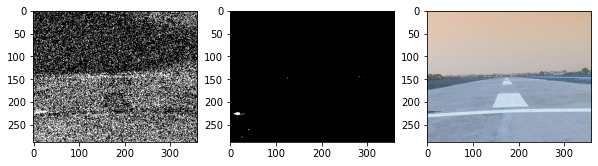

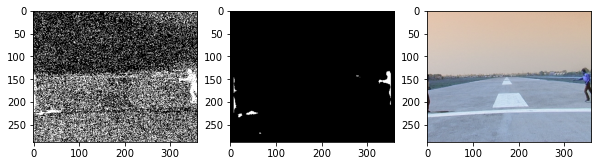

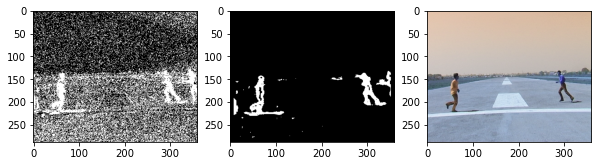

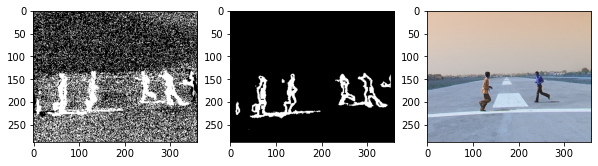




Using lambda as 0.76 and eta as 0.72


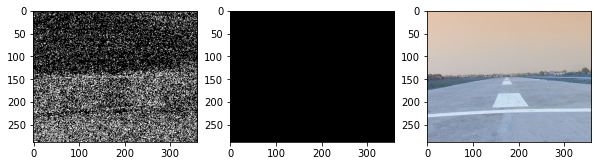

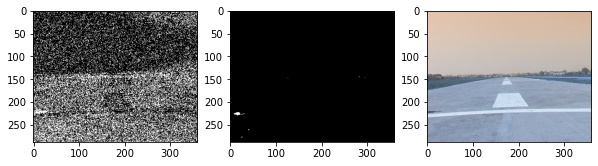

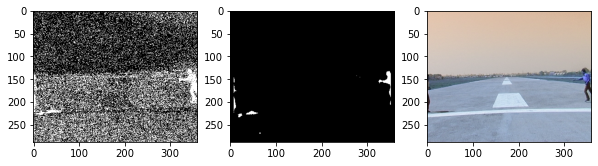

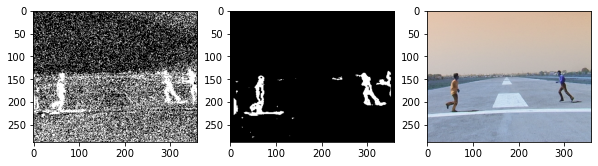

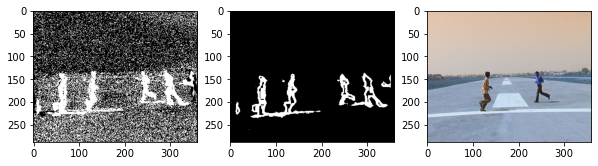




Using lambda as 0.78 and eta as 0.72


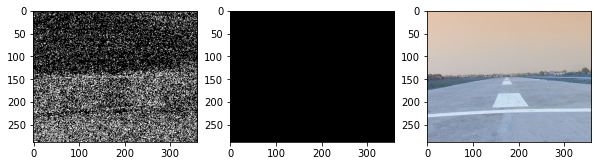

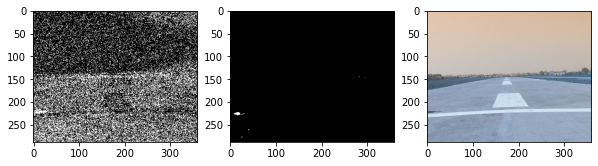

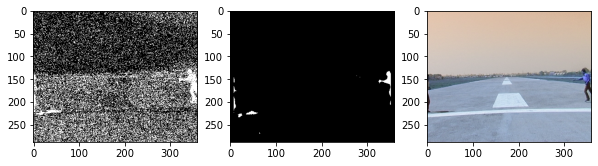

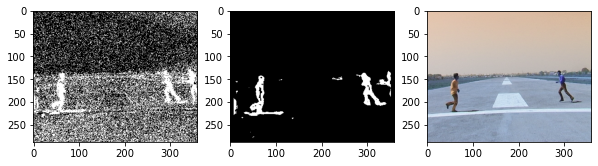

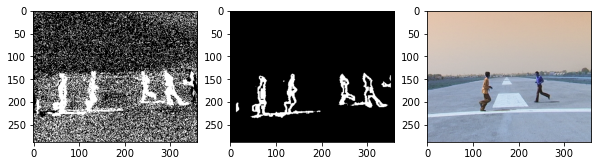




Using lambda as 0.8 and eta as 0.72


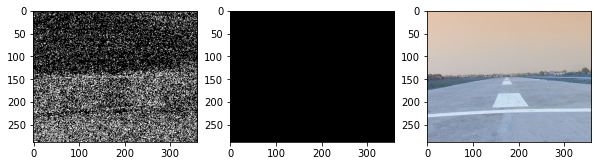

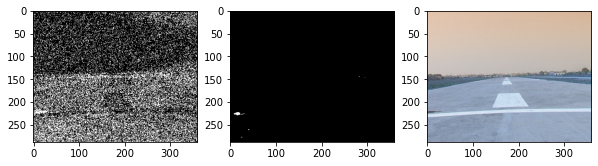

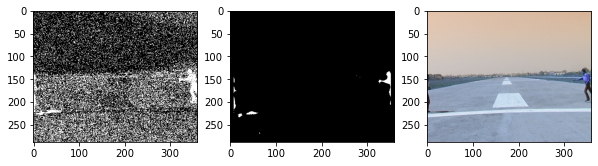

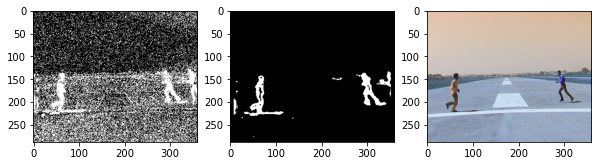

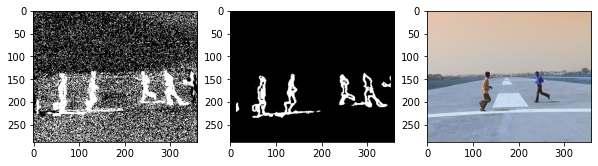




Using lambda as 0.8200000000000001 and eta as 0.72


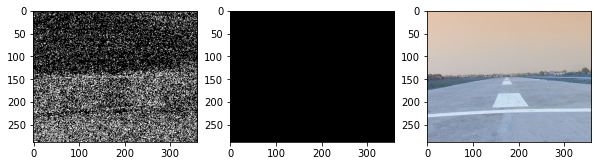

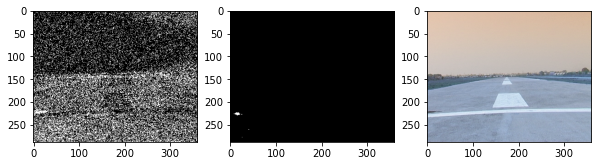

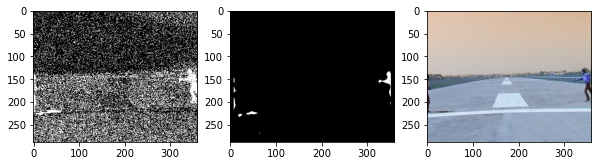

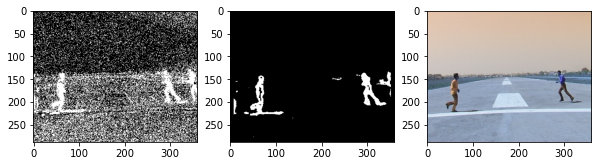

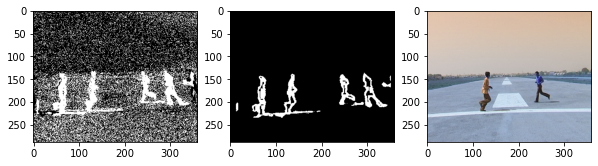




Using lambda as 0.8400000000000001 and eta as 0.72


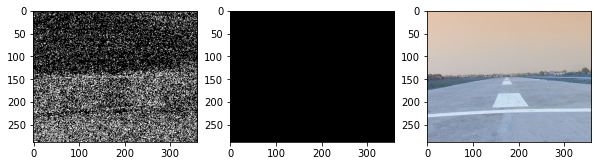

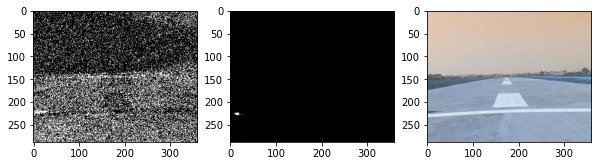

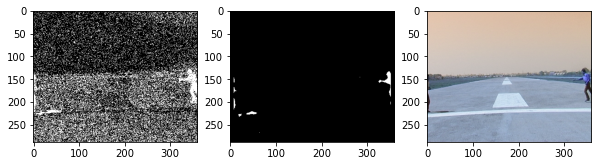

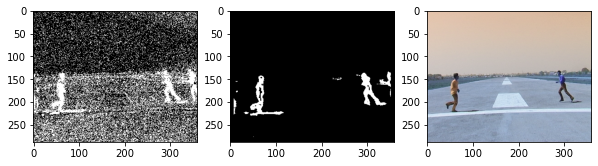

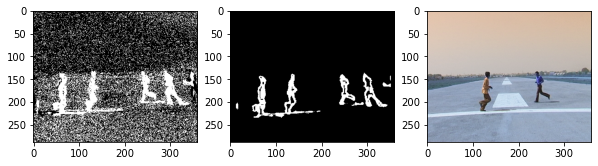




Using lambda as 0.8600000000000001 and eta as 0.72


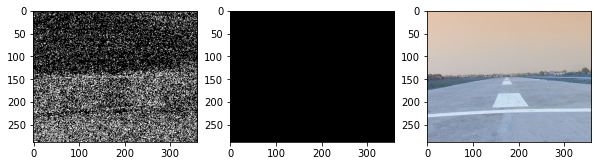

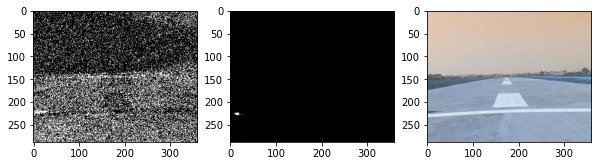

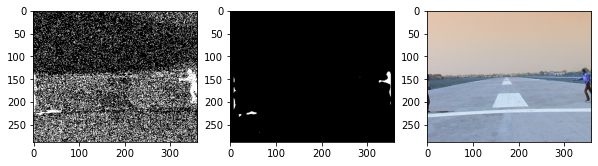

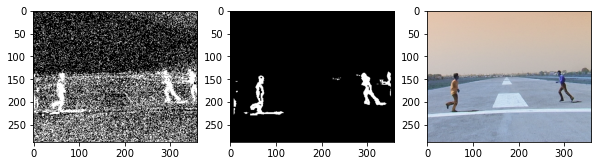

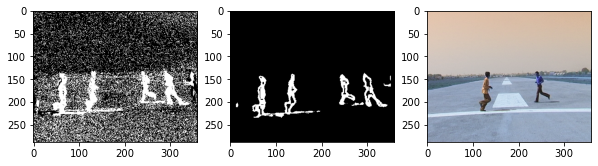




Using lambda as 0.8800000000000001 and eta as 0.72


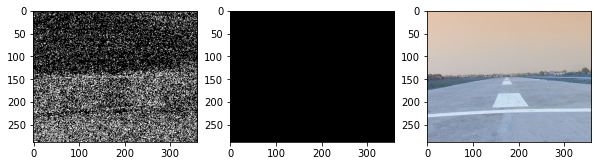

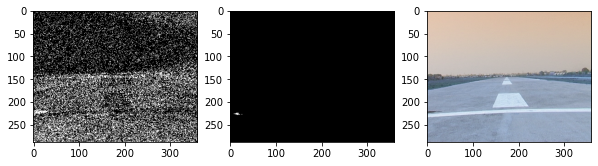

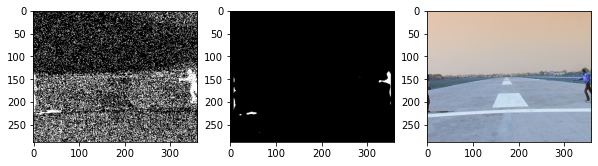

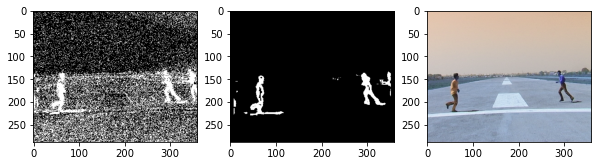

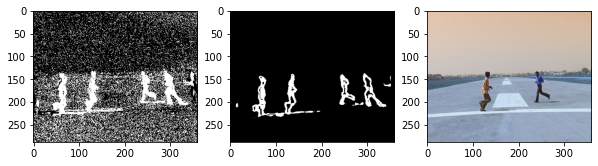




Using lambda as 0.9000000000000001 and eta as 0.72


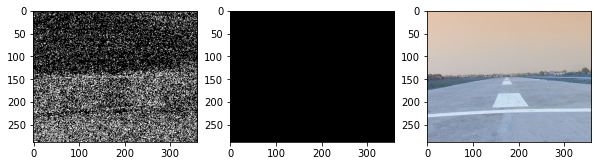

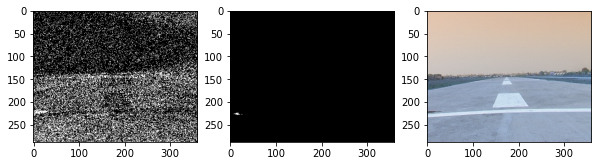

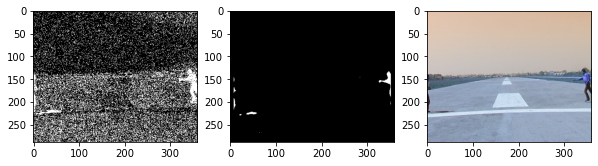

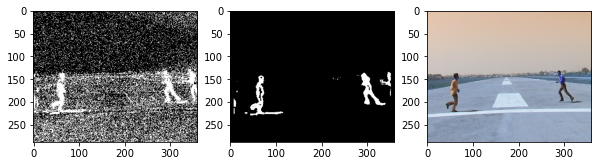

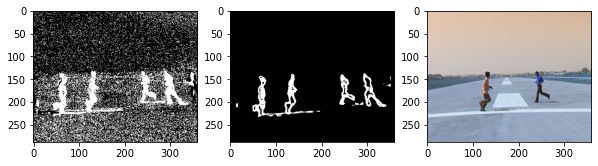




Using lambda as 0.7 and eta as 0.74


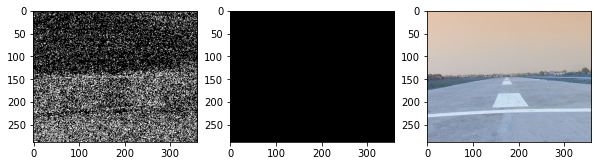

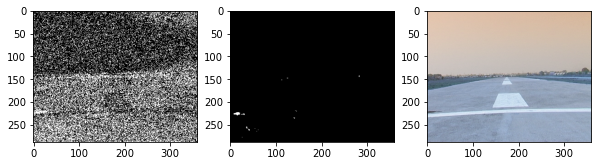

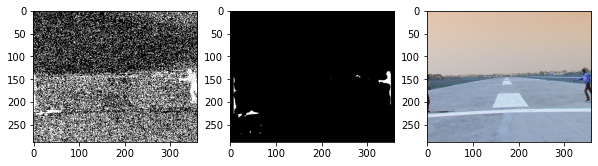

KeyboardInterrupt: 

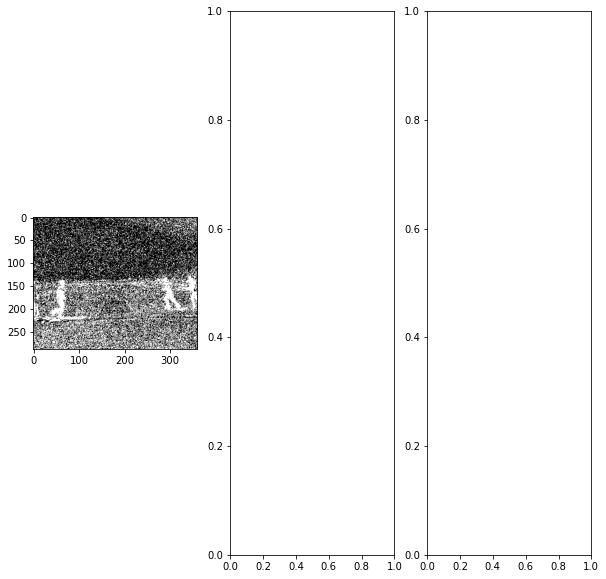

In [24]:
step = 0.02
voting_parameter = [i for i in np.arange(0.70,0.90,step)]
thresholding_parameter = [i for i in np.arange(0.70,0.90,step)]

for eta in voting_parameter:
    for lmda in thresholding_parameter:
        print("Using lambda as {} and eta as {}".format(lmda,eta))
        mean,variance = Background_Subtraction("./AirStripVideo/Images/",lmda,eta,8,8,0.8)
        print('\n\n')